# Supplementary material for the association of laminar thickness covariance and cortical hierarchy

In [33]:
import os, glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image, display
import helpers, datasets, surfaces, matrices

sns.set_style('ticks')

OUTPUT_DIR = '../output/'
SRC_DIR = '../src/'

# 1. Asymmetry-based hierarchy usign HCP data

## a) Effective connectivity matrix and weighted in-/out-degree

Effective connectivity matrix:

In [2]:
ec = matrices.ConnectivityMatrix('effective', exc_regions='adysgranular', dataset='hcp', exc_contra=False)

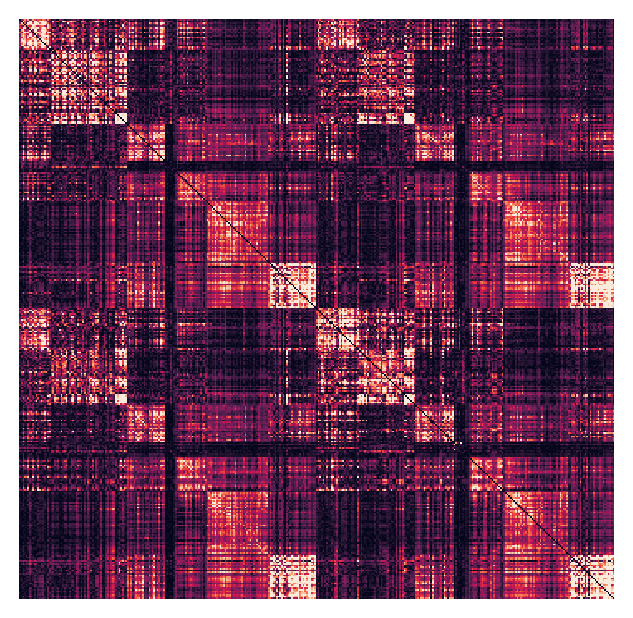

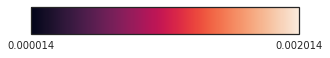

In [3]:
ec.plot()

Weighted in-degree (afferent strength):

(0.0, 1.0, 359.0, 0.0)

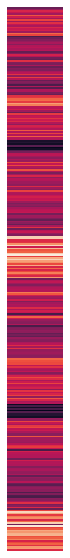

In [4]:
fig, ax = plt.subplots(figsize=(1, 10))
sns.heatmap(ec.matrix.sum(axis=1).values[:, np.newaxis], ax=ax, cbar=False)
ax.axis('off')

Weighted out-degree (efferent strength):

(0.0, 1.0, 359.0, 0.0)

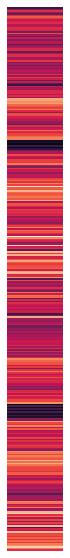

In [5]:
fig, ax = plt.subplots(figsize=(1, 10))
sns.heatmap(ec.matrix.sum(axis=0).values[:, np.newaxis], ax=ax, cbar=False)
ax.axis('off')

## b) Asymmetry-based hierarchy map in association with LTC G1

Asymmetry-based hierarchy:

In [6]:
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='hcp')

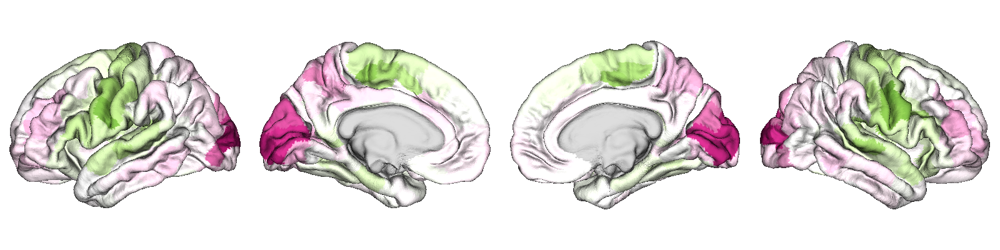

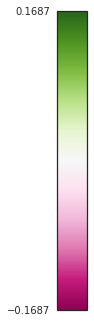

In [7]:
hierarchy_surf = helpers.deparcellate(ec_maps.parcellated_data.loc[:, 'hierarchy'], 'schaefer400', space='fsaverage', downsampled=False)
helpers.plot_surface(hierarchy_surf, cmap='PiYG', vrange='sym', layout_style='row', cbar=True, plot_downsampled=False, space='fsaverage', inflate=False)

Correlation of LTC G1 with asymmetry-based hierarchy:

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Creating 1000 surrogates based on variograms in /home/asaberi/laminar_gradients/code/../output/connectivity/ec_parc-schaefer400_data-hcp/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-359.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/distance/geodesic_distance_matrix_parc-schaefer400_approach-center-to-center.npz

Correlation coefficient


,hierarchy
LTC G1,-0.490575



p-value


,hierarchy
LTC G1,0.0


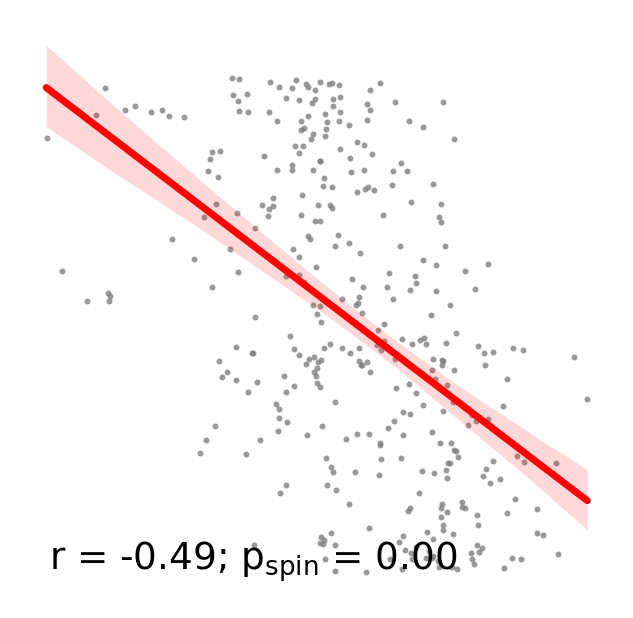

In [8]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'schaefer400'))
r, p = ec_maps.correlate(ltcg, x_columns=['hierarchy'], y_columns=['LTC G1'], n_perm=1000, axis_off=True)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

# 2. Association of individual layers with cortical hierarchy

## a) Asymmetry-based hierarchy

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/connectivity/ec_parc-schaefer400_data-mics/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-359.npz and have the same parcels

Correlation coefficient


,hierarchy
Layer 1 relative thickness,0.097213
Layer 2 relative thickness,-0.041658
Layer 3 relative thickness,-0.165989
Layer 4 relative thickness,-0.382328
Layer 5 relative thickness,0.234864
Layer 6 relative thickness,0.445059



p-value


,hierarchy
Layer 1 relative thickness,0.050
Layer 2 relative thickness,0.484
Layer 3 relative thickness,0.000
Layer 4 relative thickness,0.000
Layer 5 relative thickness,0.000
Layer 6 relative thickness,0.000


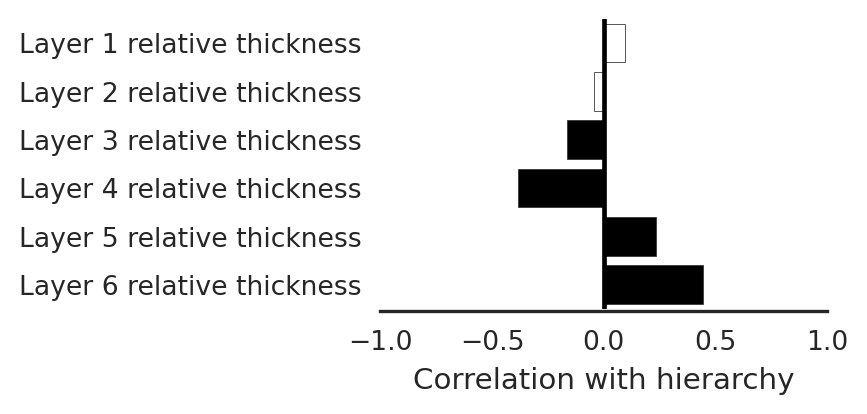

In [9]:
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='mics')
laminar_features = surfaces.LaminarFeatures(parcellation_name='schaefer400', exc_regions='adysgranular')
r, p = ec_maps.correlate(laminar_features, x_columns=['hierarchy'], y_columns=[f'Layer {i} relative thickness' for i in range(1, 7)], regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

## b) Macaque's laminar-based hierarchy

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/macaque_hierarchy/variogram_surrogates_Laminar-based hierarchy_nperm-1000_nparcels-91.npz and have the same parcels

Correlation coefficient


,Laminar-based hierarchy
Layer 1 relative thickness,0.246054
Layer 2 relative thickness,-0.103637
Layer 3 relative thickness,-0.312160
Layer 4 relative thickness,-0.594074
Layer 5 relative thickness,0.494473
Layer 6 relative thickness,0.677970



p-value


,Laminar-based hierarchy
Layer 1 relative thickness,0.081
Layer 2 relative thickness,0.368
Layer 3 relative thickness,0.001
Layer 4 relative thickness,0.000
Layer 5 relative thickness,0.000
Layer 6 relative thickness,0.000


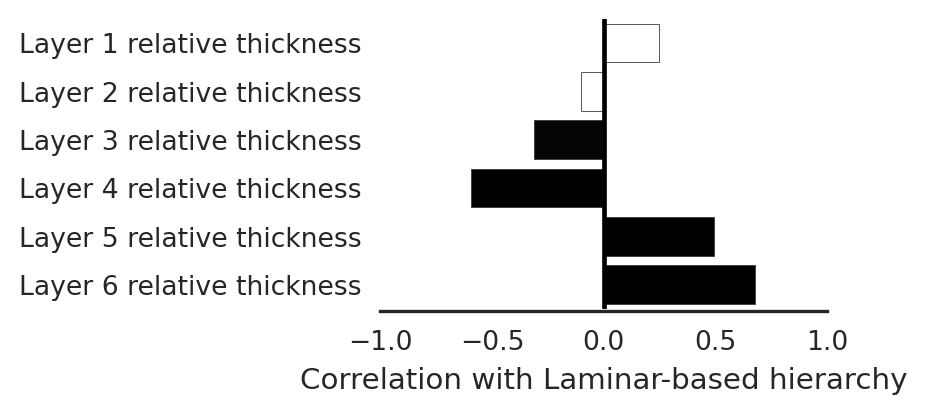

In [10]:
macaque_laminar_thickness = surfaces.MacaqueSurface(laminar_features, [f'Layer {i} relative thickness' for i in range(1, 7)])
macaque_hierarchy = surfaces.MacaqueHierarchy()
r, p = macaque_hierarchy.correlate(macaque_laminar_thickness, regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

# 3. Afferent and efferent strengths

In [11]:
ec_maps = surfaces.EffectiveConnectivityMaps('mics')

In [12]:
ec_maps_fsa = helpers.deparcellate(ec_maps.parcellated_data, 'schaefer400', space='fsaverage', downsampled=False)

Afferent

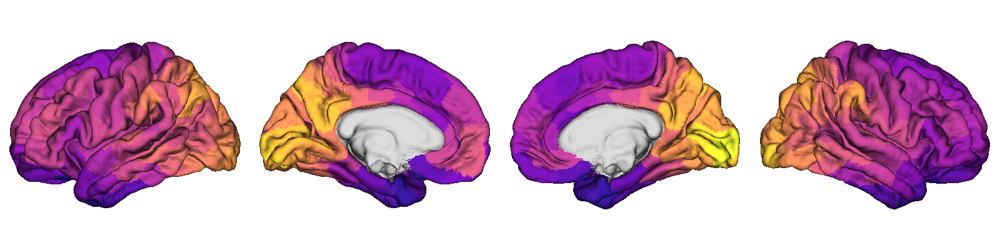

In [13]:
helpers.plot_surface(ec_maps_fsa[:, 0], space='fsaverage', inflate=False, cmap='plasma', plot_downsampled=False)

Efferent

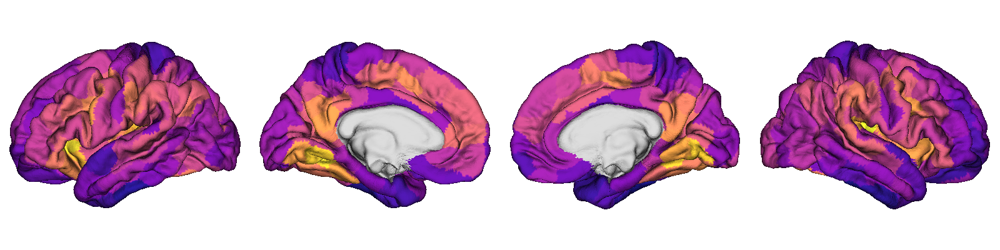

In [14]:
helpers.plot_surface(ec_maps_fsa[:, 1], space='fsaverage', inflate=False, cmap='plasma', plot_downsampled=False)

Correlation of afferent and efferent strength with LTC G1

In [15]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness','schaefer400'))

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz


Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/ltc/parc-schaefer400_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-359.npz and have the same parcels


(            LTC G1
 afferent  0.605280
 efferent -0.006818,
           LTC G1
 afferent   0.000
 efferent   0.868)

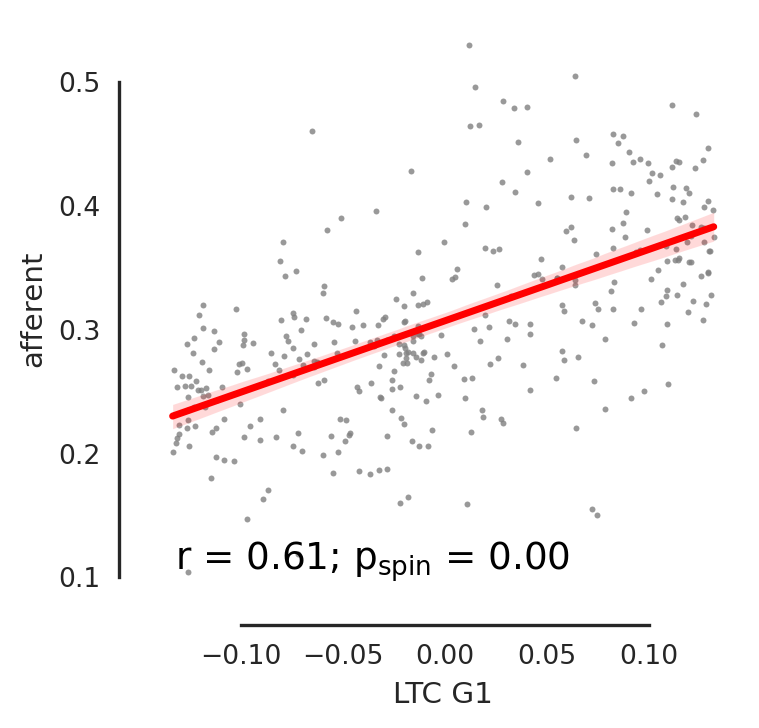

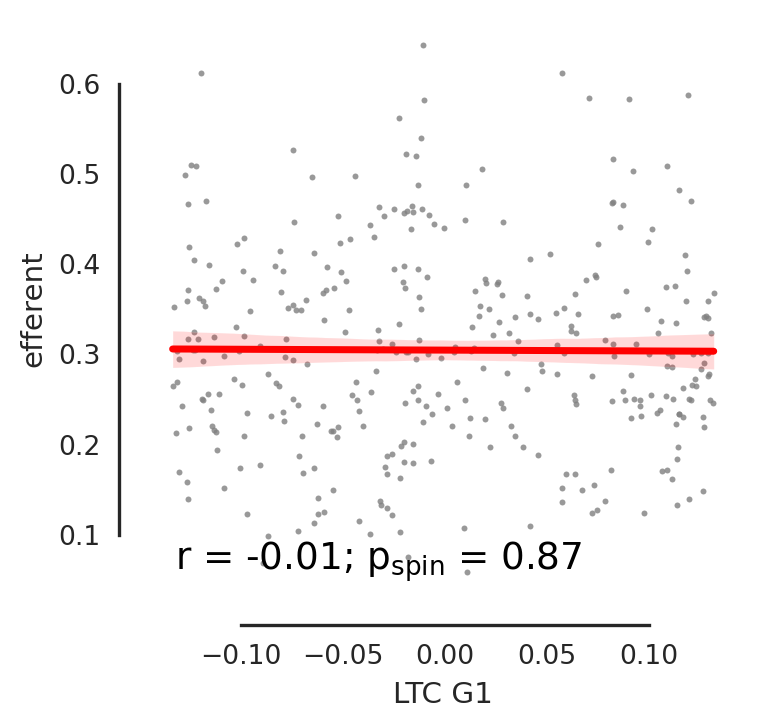

In [16]:
ltcg.correlate(ec_maps, x_columns=['LTC G1'], y_columns=['afferent', 'efferent'], barplot=False)

# 4. Excitatory and inhibitory neuronal subtypes in association to LTC G1 and hierarchy

## a) Excitatory subtypes

Subtype maps

In [17]:
exc_types = surfaces.NeuronalSubtypesMaps('exc', 'sjh')

Ex1
0 of 14 genes do not exist
Ex2
1 of 9 genes do not exist
Ex3
0 of 4 genes do not exist
Ex4
1 of 12 genes do not exist
Ex5
0 of 8 genes do not exist
Ex6
2 of 33 genes do not exist
Ex7
0 of 3 genes do not exist
Ex8
5 of 57 genes do not exist


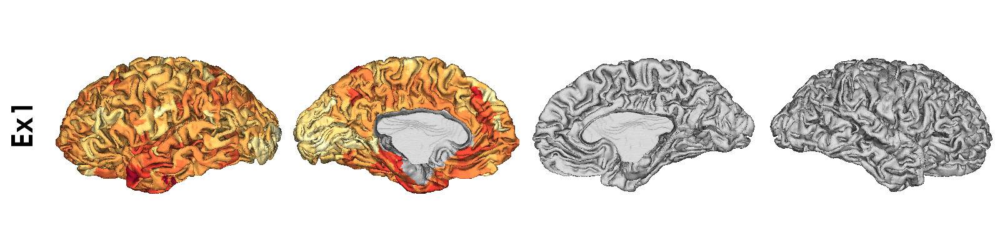

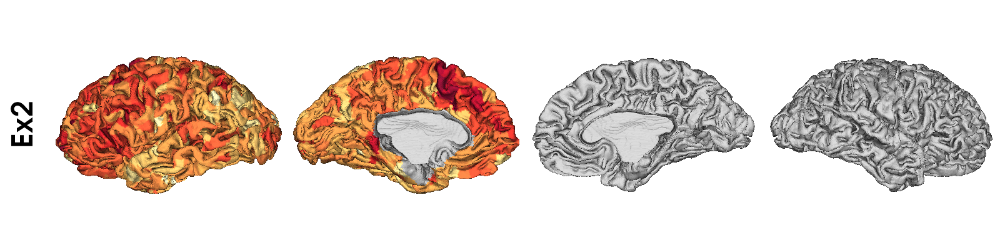

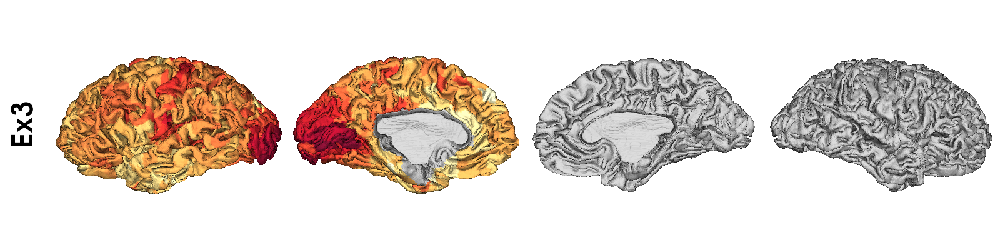

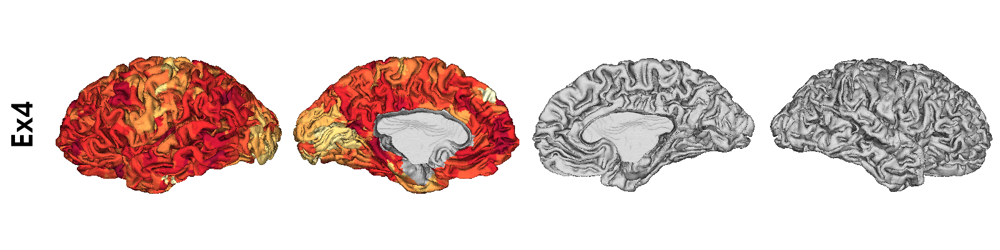

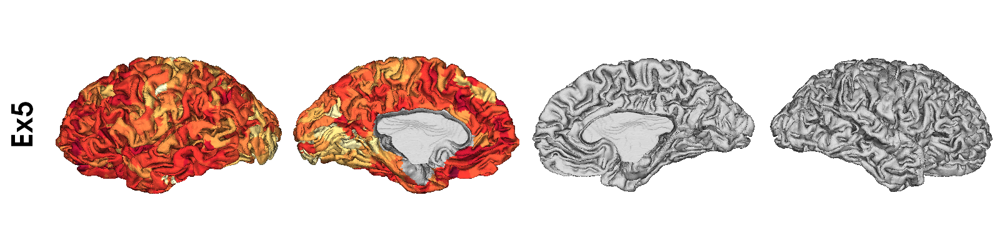

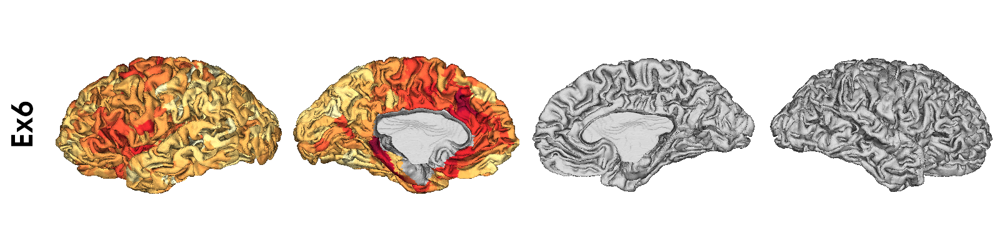

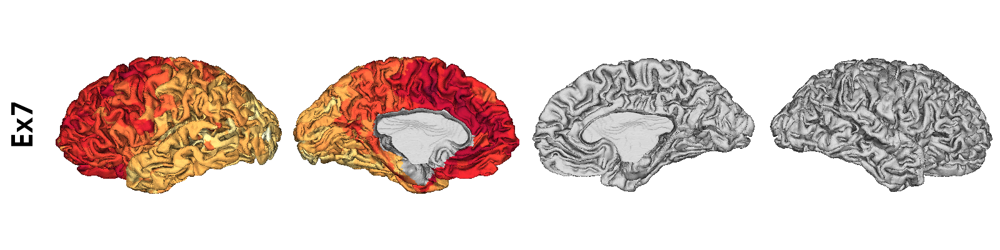

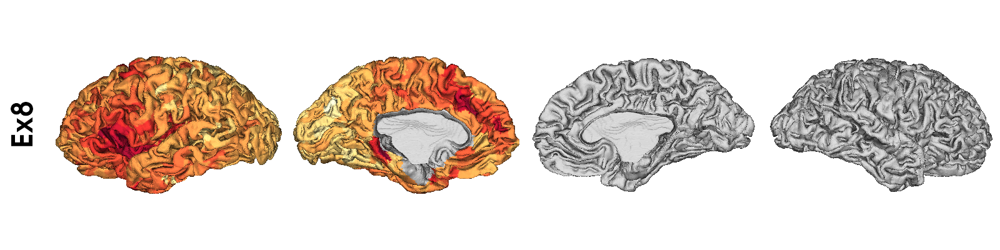

In [18]:
display(*exc_types.plot(inflate=False, label_loc='left'))

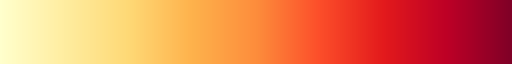

In [37]:
sns.color_palette(exc_types.cmap, as_cmap=True)

## b) Association of excitatory subtypes with LTC G1 and hierarchy maps

Correlation with LTC G1:

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Creating 1000 surrogates based on variograms in /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-444.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/distance/geodesic_distance_matrix_parc-sjh_approach-center-to-center.npz

Correlation coefficients


,LTC G1
Ex1,-0.034263
Ex2,-0.287577
Ex3,0.229810
Ex4,-0.015507
Ex5,-0.179897
Ex6,-0.432819
Ex7,-0.468321
Ex8,-0.490266



p-values


,LTC G1
Ex1,0.926857
Ex2,0.412800
Ex3,0.412800
Ex4,0.933000
Ex5,0.493333
Ex6,0.160000
Ex7,0.412800
Ex8,0.200000


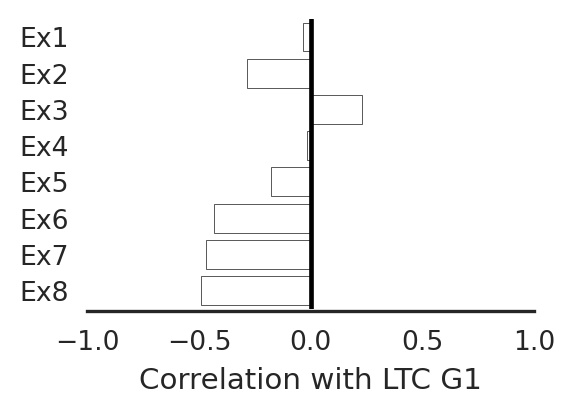

In [19]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))
r, p = ltcg.correlate(exc_types, x_columns=['LTC G1'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with laminar-based hierarchy:

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/macaque_hierarchy/variogram_surrogates_Laminar-based hierarchy_nperm-1000_nparcels-91.npz and have the same parcels

Correlation coefficients


,Laminar-based hierarchy
Ex1,0.592641
Ex2,0.110920
Ex3,-0.741461
Ex4,0.209457
Ex5,0.442234
Ex6,0.535484
Ex7,0.350119
Ex8,0.446664



p-values


,Laminar-based hierarchy
Ex1,0.000
Ex2,0.368
Ex3,0.000
Ex4,0.032
Ex5,0.000
Ex6,0.000
Ex7,0.000
Ex8,0.000


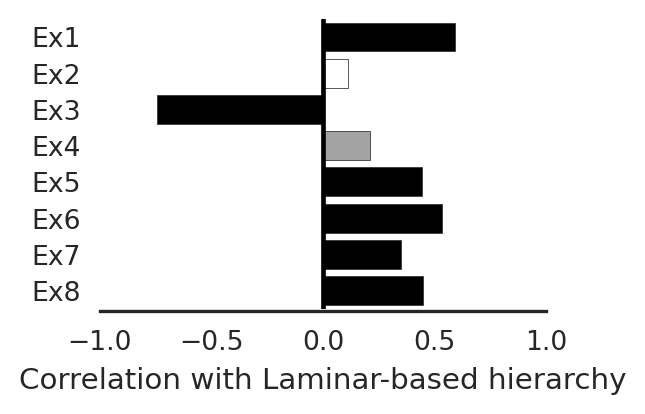

In [20]:
# transform exc types maps to macaque space
exc_types_macaque = surfaces.MacaqueSurface(exc_types)
macaque_hierarchy = surfaces.MacaqueHierarchy()
r, p = macaque_hierarchy.correlate(exc_types_macaque, fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with asymmetry-based hierarchy:

Ex1
0 of 14 genes do not exist
Ex2
1 of 9 genes do not exist
Ex3
0 of 4 genes do not exist
Ex4
1 of 12 genes do not exist
Ex5
0 of 8 genes do not exist
Ex6
2 of 33 genes do not exist
Ex7
0 of 3 genes do not exist
Ex8
5 of 57 genes do not exist
Calculating correlations with variogram test (parcellated)
Creating 1000 surrogates based on variograms in /home/asaberi/laminar_gradients/code/../output/connectivity/ec_parc-schaefer400_data-mics/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-200.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/distance/geodesic_distance_matrix_parc-schaefer400_approach-center-to-center.npz

Correlation coefficient


,hierarchy
Ex1,0.162884
Ex2,0.235522
Ex3,-0.210831
Ex4,0.130528
Ex5,0.111899
Ex6,0.293983
Ex7,0.252896
Ex8,0.440616



p-value


,hierarchy
Ex1,0.020000
Ex2,0.002000
Ex3,0.003200
Ex4,0.029714
Ex5,0.091000
Ex6,0.000000
Ex7,0.000000
Ex8,0.000000


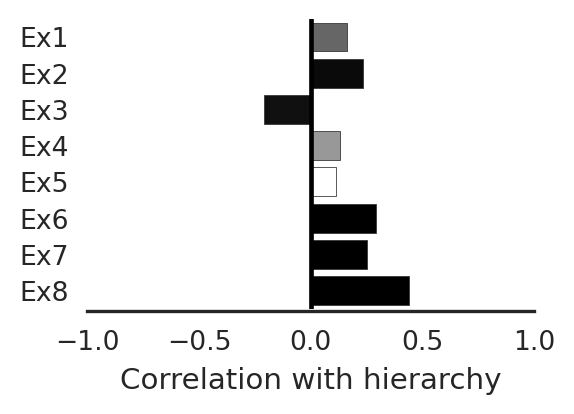

In [21]:
# recreate exc types maps in schaefer400 parcellation
exc_types_sch400 = surfaces.NeuronalSubtypesMaps('exc', 'schaefer400')
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='mics')
r, p = ec_maps.correlate(exc_types_sch400, x_columns=['hierarchy'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)

## a) Inhibitory subtypes

Subtype maps

In [34]:
inh_types = surfaces.NeuronalSubtypesMaps('inh', 'sjh')

In1
0 of 2 genes do not exist
In2
0 of 4 genes do not exist
In3
0 of 12 genes do not exist
In4
0 of 6 genes do not exist
In5
2 of 7 genes do not exist
In6
0 of 4 genes do not exist
In7
0 of 6 genes do not exist
In8
0 of 1 genes do not exist


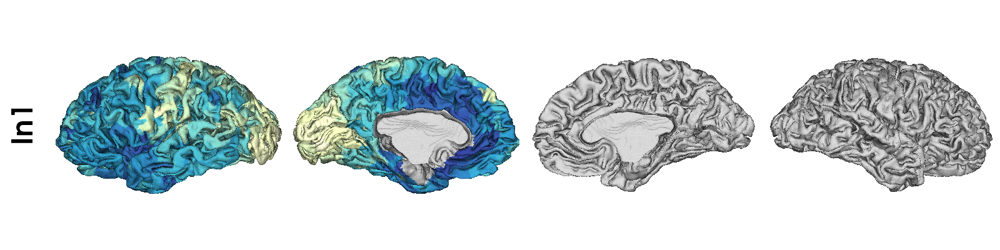

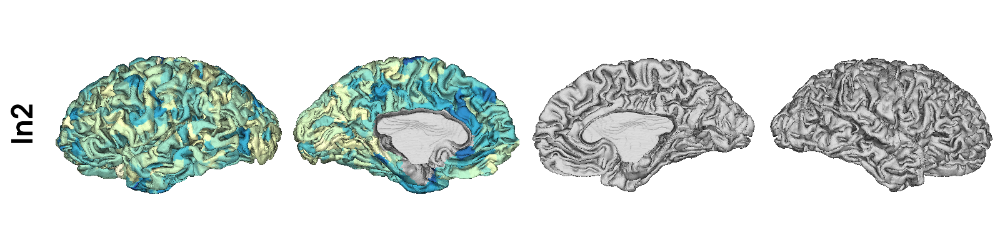

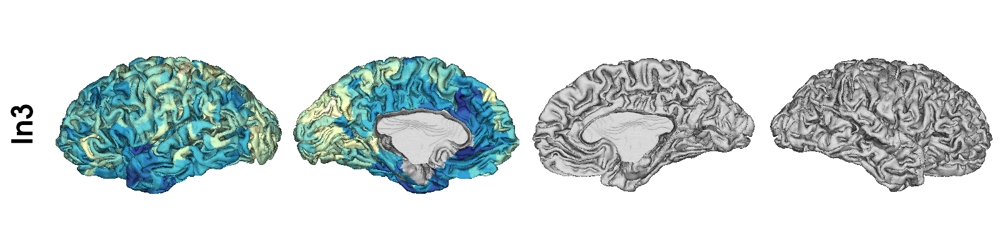

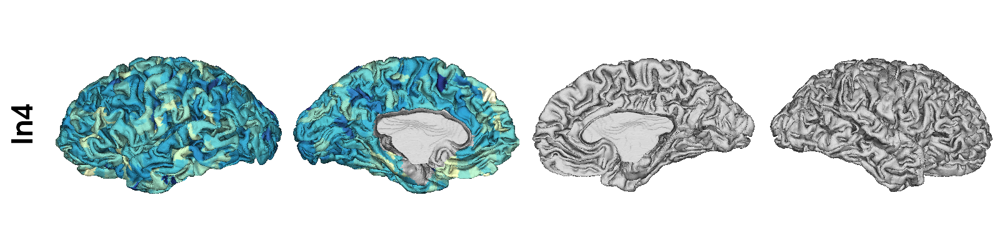

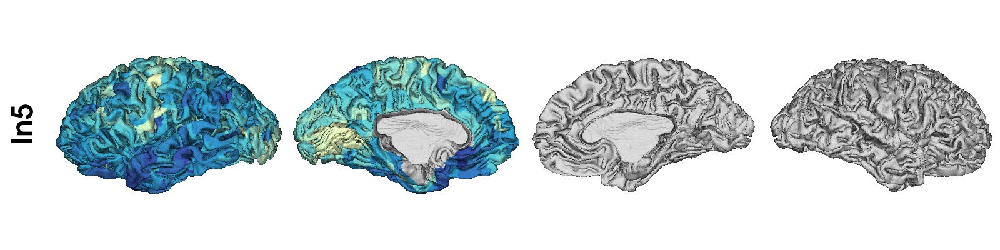

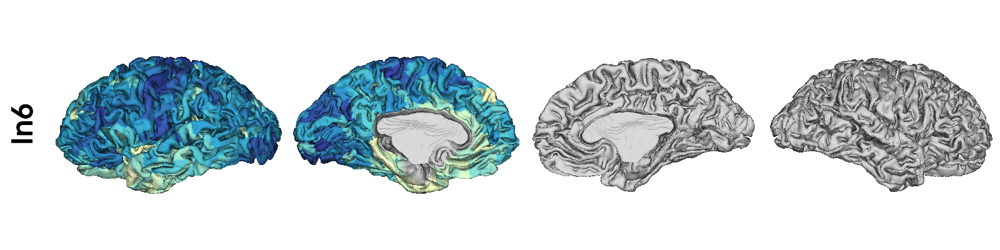

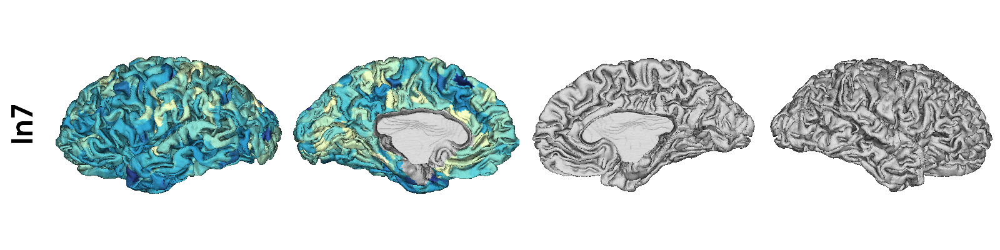

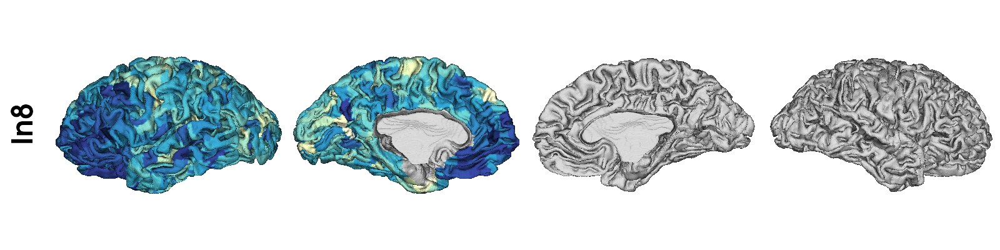

In [23]:
display(*inh_types.plot(inflate=False, label_loc='left'))

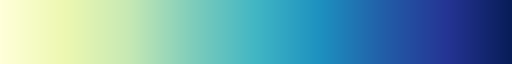

In [36]:
sns.color_palette(inh_types.cmap, as_cmap=True)

Correlation with LTC G1:

Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Loading the matrix from /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/matrix.npz
Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/ltc/parc-sjh_curv-smooth-10_exc-adysgranular_metric-parcor/gradients_approach-dm_kernel-normalized_angle_sparsity-09_n-10/variogram_surrogates_LTC G1_nperm-1000_nparcels-444.npz and have the same parcels

Correlation coefficients


,LTC G1
In1,-0.372528
In2,-0.079601
In3,-0.231077
In4,0.104365
In5,-0.001965
In6,-0.043017
In7,-0.203727
In8,-0.217764



p-values


,LTC G1
In1,0.496000
In2,0.569333
In3,0.496000
In4,0.569333
In5,0.996000
In6,0.954286
In7,0.496000
In8,0.569333


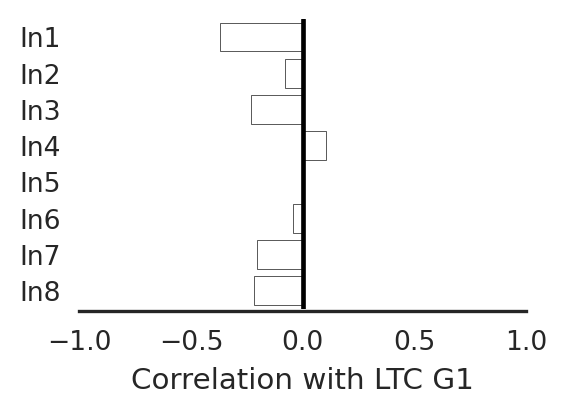

In [24]:
ltcg = surfaces.MicrostructuralCovarianceGradients(matrices.MicrostructuralCovarianceMatrix('thickness', 'sjh'))
r, p = ltcg.correlate(inh_types, x_columns=['LTC G1'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with laminar-based hierarchy:

Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/macaque_hierarchy/variogram_surrogates_Laminar-based hierarchy_nperm-1000_nparcels-91.npz and have the same parcels

Correlation coefficients


,Laminar-based hierarchy
In1,0.740713
In2,0.552843
In3,0.613014
In4,-0.267977
In5,0.235048
In6,-0.741944
In7,0.238580
In8,0.003721



p-values


,Laminar-based hierarchy
In1,0.000000
In2,0.000000
In3,0.000000
In4,0.008000
In5,0.025333
In6,0.000000
In7,0.035429
In8,0.968000


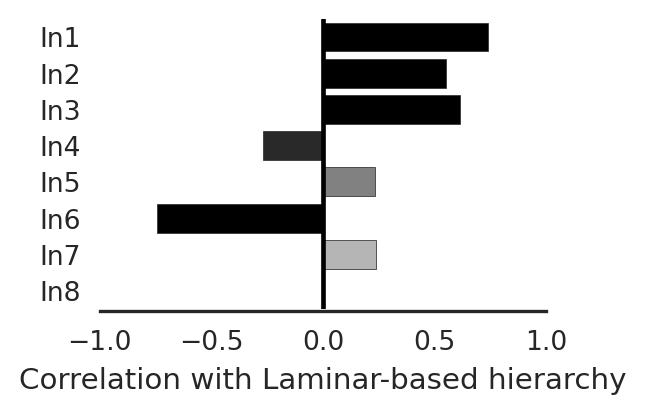

In [35]:
# transform exc types maps to macaque space
inh_types_macaque = surfaces.MacaqueSurface(inh_types)
macaque_hierarchy = surfaces.MacaqueHierarchy()
r, p = macaque_hierarchy.correlate(inh_types_macaque, fdr_axis='y', regplot=False)
print("\nCorrelation coefficients")
display(r)
print("\np-values")
display(p)

Correlation with asymmetry-based hierarchy:

In1
0 of 2 genes do not exist
In2
0 of 4 genes do not exist
In3
0 of 12 genes do not exist
In4
0 of 6 genes do not exist
In5
2 of 7 genes do not exist
In6
0 of 4 genes do not exist
In7
0 of 6 genes do not exist
In8
0 of 1 genes do not exist
Calculating correlations with variogram test (parcellated)
Surrogates already exist in /home/asaberi/laminar_gradients/code/../output/connectivity/ec_parc-schaefer400_data-mics/maps/variogram_surrogates_hierarchy_nperm-1000_nparcels-200.npz and have the same parcels

Correlation coefficient


,hierarchy
In1,0.352652
In2,0.036996
In3,0.211407
In4,-0.046915
In5,0.073741
In6,-0.082325
In7,0.242952
In8,0.122514



p-value


,hierarchy
In1,0.000000
In2,0.652000
In3,0.010667
In4,0.652000
In5,0.416000
In6,0.401600
In7,0.000000
In8,0.066000


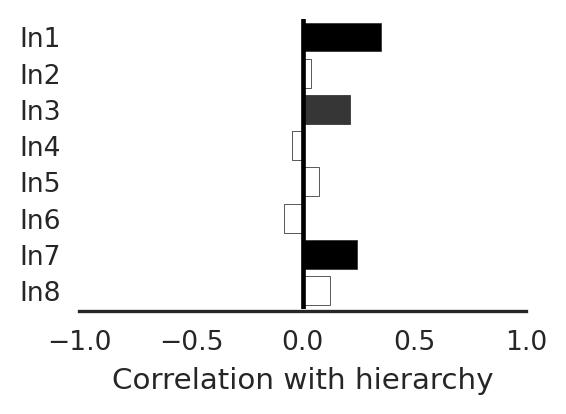

In [26]:
# recreate exc types maps in schaefer400 parcellation
inh_types_sch400 = surfaces.NeuronalSubtypesMaps('inh', 'schaefer400')
ec_maps = surfaces.EffectiveConnectivityMaps(dataset='mics')
r, p = ec_maps.correlate(inh_types_sch400, x_columns=['hierarchy'], fdr_axis='y', regplot=False)
print("\nCorrelation coefficient")
display(r)
print("\np-value")
display(p)